Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [1]:
import pandas

"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
# !git clone https://github.com/DmitryUlyanov/deep-image-prior
# !mv deep-image-prior/* ./

'\n*Uncomment if running on colab* \nSet Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab \n'

# Import libs

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
import pandas as pd
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *

# torch.backends.cudnn.enabled = True
# torch.backends.cudnn.benchmark =True
# dtype = torch.cuda.FloatTensor
dtype = torch.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [3]:
# deJPEG 
# fname = 'data/denoising/snail.jpg'

## denoising
fname = 'data/denoising/F16_GT.png'

# Load image

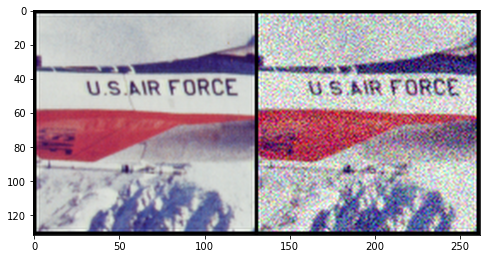

In [4]:
if fname == 'data/denoising/snail.jpg':
    img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)
    
    # As we don't have ground truth
    img_pil = img_noisy_pil
    img_np = img_noisy_np
    
    if PLOT:
        plot_image_grid([img_np], 4, 5);
        
elif fname == 'data/denoising/F16_GT.png':
    # Add synthetic noise
    shift_x = 80
    shift_y = 60
    img_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_pil = img_pil.crop([128+shift_x,128+shift_y,256 + shift_x,256+shift_y])
    img_np = pil_to_np(img_pil)
    
    img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
    
    if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);
else:
    assert False

# Setup

In [5]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99
dirichlet_param_scalar = 1000

if fname == 'data/denoising/snail.jpg':
    num_iter = 2400
    input_depth = 3
    figsize = 5 
    
    net = skip(
                input_depth, 3, 
                num_channels_down = [8, 16, 32, 64, 128], 
                num_channels_up   = [8, 16, 32, 64, 128],
                num_channels_skip = [0, 0, 0, 4, 4], 
                upsample_mode='bilinear',
                need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

    net = net.type(dtype)

elif fname == 'data/denoising/F16_GT.png':
    num_iter = 3000
    input_depth = 32 
    figsize = 4 
    
    
    net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128, 
                  skip_n33u=128, 
                  skip_n11=4, 
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False
    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

gt_distribution, exp_sums = dirichlet.get_softmax_gt(img_noisy_torch, img_noisy_np)


Number of params: 2217831


# Optimize

Starting optimization with ADAM


[W NNPACK.cpp:80] Could not initialize NNPACK! Reason: Unsupported hardware.
/Users/ruicong/opt/anaconda3/envs/deep-image-prior/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/Users/ruicong/opt/anaconda3/envs/deep-image-prior/lib/python3.7/site-packages/skimage/measure/simple_metrics.py:127: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  warn("Inputs have mismatched dtype.  Setting data_range based on "


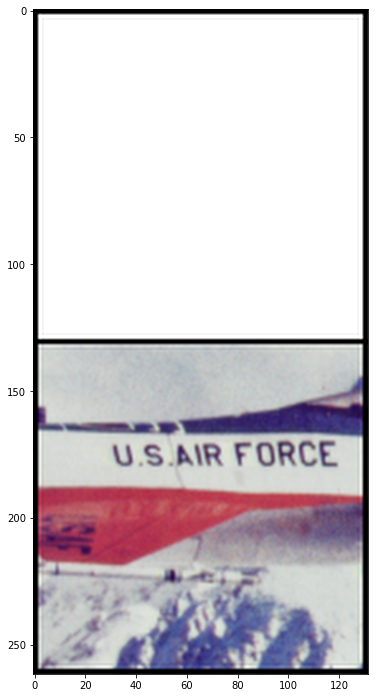

Iteration 00007    Loss 6792.284668   PSNR_noisy: 4.260943   PSRN_gt: 4.370699 PSNR_gt_sm: -8.832367 Iteration 00009    Loss 5425.375000   PSNR_noisy: 6.496269   PSRN_gt: 6.674954 PSNR_gt_sm: -8.775117 Iteration 00011    Loss 2716.242188   PSNR_noisy: 9.792035   PSRN_gt: 10.181431 PSNR_gt_sm: -8.716423 Iteration 00013    Loss 1687.984253   PSNR_noisy: 11.484894   PSRN_gt: 12.084639 PSNR_gt_sm: -8.657397 Iteration 00015    Loss 2075.100098   PSNR_noisy: 10.581615   PSRN_gt: 11.054083 PSNR_gt_sm: -8.598089 Iteration 00017    Loss 2082.972412   PSNR_noisy: 10.417061   PSRN_gt: 10.890468 PSNR_gt_sm: -8.538528 Iteration 00019    Loss 1735.847534   PSNR_noisy: 11.179870   PSRN_gt: 11.739878 PSNR_gt_sm: -8.478791 Iteration 00021    Loss 1331.185913   PSNR_noisy: 12.384103   PSRN_gt: 13.131227 PSNR_gt_sm: -8.418653 Iteration 00023    Loss 1288.927490   PSNR_noisy: 12.673306   PSRN_gt: 13.488623 PSNR_gt_sm: -8.358081 Iteration 00025    Loss 1324.782593   PSNR_noisy: 12.642730   PSRN_gt: 13.4262

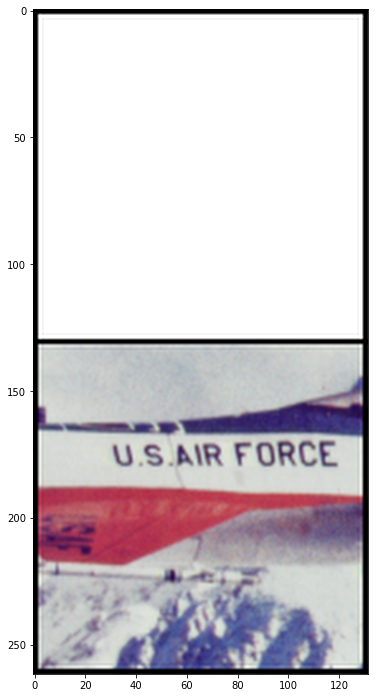

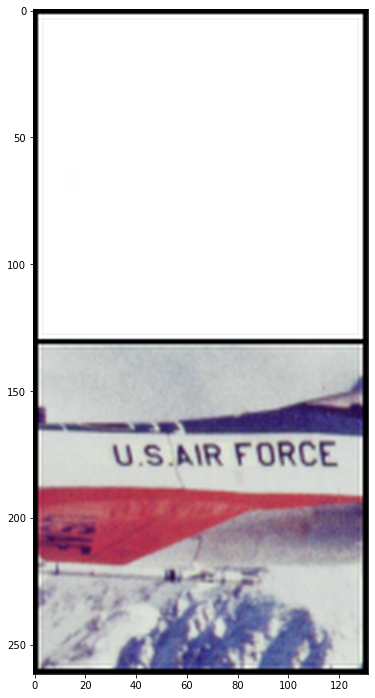

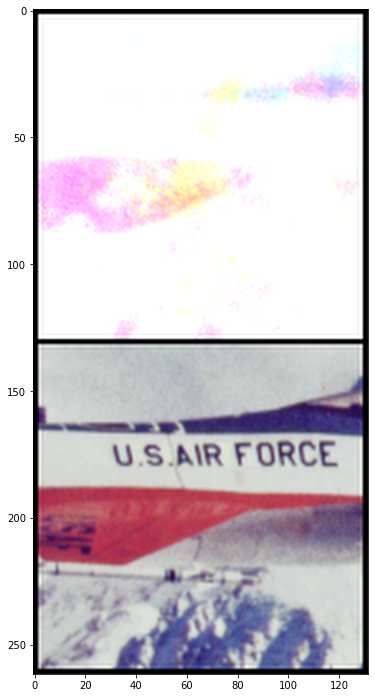

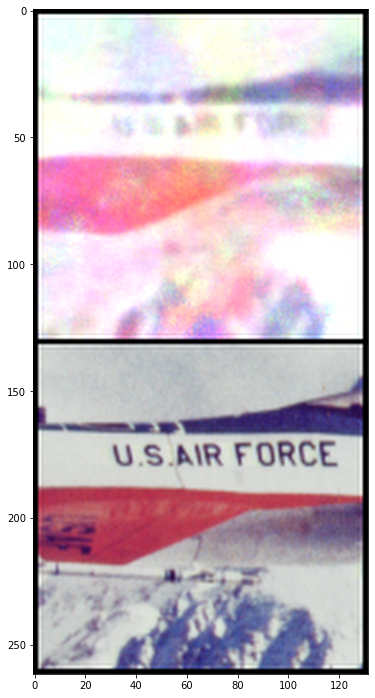

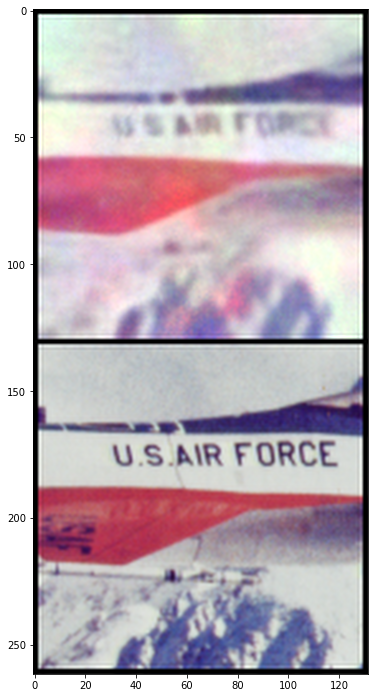

...

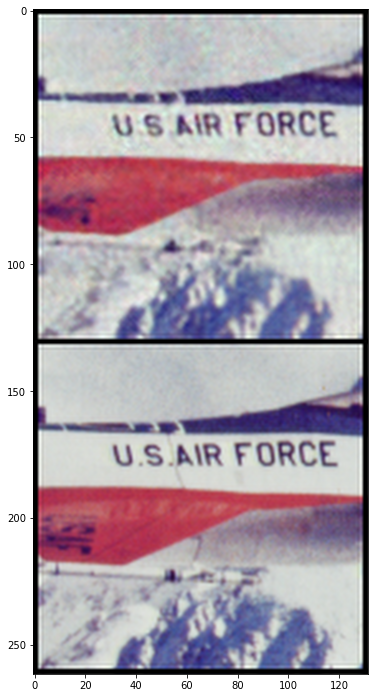

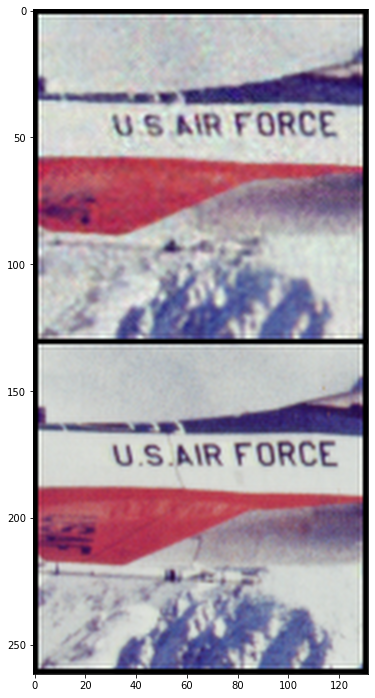

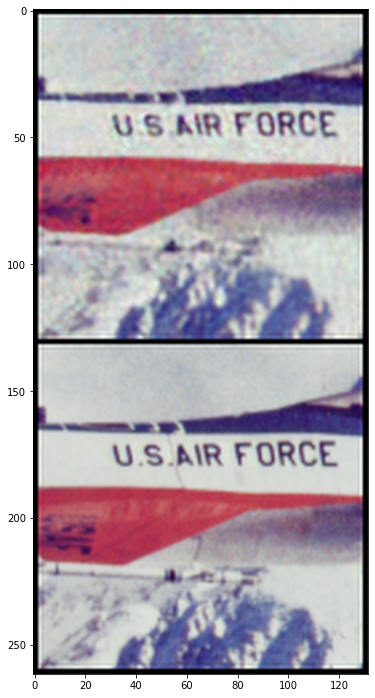

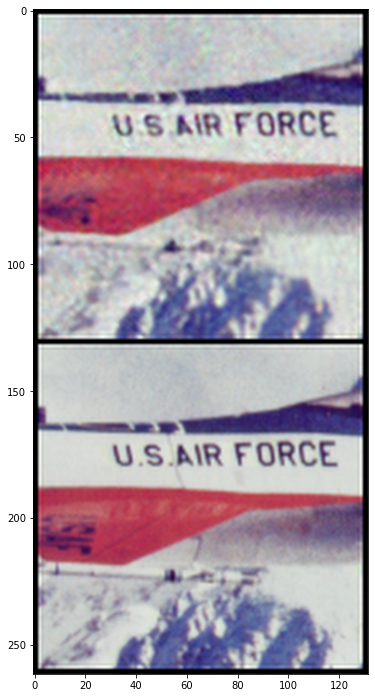

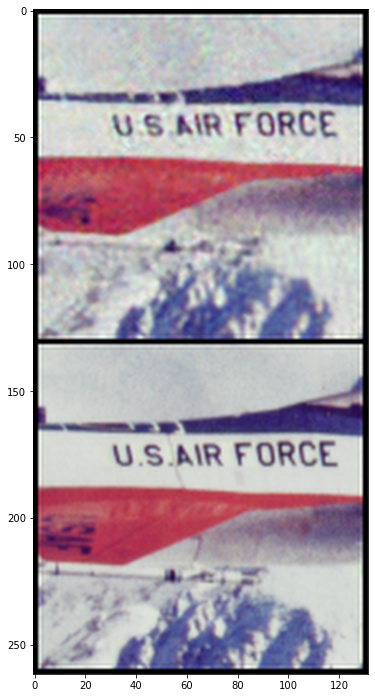

In [6]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

RESULTS_DIC = {'iteration': [], 'psrn_noisy': [], 'psrn_gt': [], 'psrn_gt_sm': []}

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    # total_loss = mse(out, img_noisy_torch)
    total_loss = dirichlet.dirichlet_kl_divergence(out, gt_distribution, dirichlet_param_scalar)
    # total_loss = mse(out, gt_distribution)
    total_loss.backward()
        
    
    # psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0])
    # psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0])
    # psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0])

    psrn_noisy = compare_psnr(img_noisy_np, dirichlet.recover_softmax(out.detach().cpu().numpy()[0], exp_sums, dirichlet_param_scalar))
    psrn_gt    = compare_psnr(img_np, dirichlet.recover_softmax(out.detach().cpu().numpy()[0], exp_sums, dirichlet_param_scalar))
    psrn_gt_sm = compare_psnr(img_np, dirichlet.recover_softmax(out_avg.detach().cpu().numpy()[0], exp_sums, dirichlet_param_scalar))

    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        # out_np = torch_to_np(out)
        out_np = torch_to_np(out_avg)
        out_plot = dirichlet.recover_softmax(out_np, exp_sums, dirichlet_param_scalar)
        # plot_image_grid([np.clip(out_plot, 0, 1),
        #                  np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        plot_image_grid([np.clip(out_plot, 0, 1),
                         img_np], factor=figsize, nrow=1)

        RESULTS_DIC['iteration'].append(i)
        RESULTS_DIC['psrn_noisy'].append(psrn_noisy)
        RESULTS_DIC['psrn_gt'].append(psrn_gt)
        RESULTS_DIC['psrn_gt_sm'].append(psrn_gt_sm)

        
        
    
    # Backtracking
    if i % show_every:
        # if psrn_noisy - psrn_noisy_last < -5:
        #     print('Falling back to previous checkpoint.')
        #
        #     for new_param, net_param in zip(last_net, net.parameters()):
        #         net_param.data.copy_(new_param.cuda())
        #
        #     return total_loss*0
        # else:
        #     last_net = [x.detach().cpu() for x in net.parameters()]
        #     psrn_noisy_last = psrn_noisy
        last_net = [x.detach().cpu() for x in net.parameters()]
        psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

# convert dic to csv and output
file_name = 'results_with_scalar_' + str(dirichlet_param_scalar) + '.csv'
pandas.DataFrame.from_dict(RESULTS_DIC).to_csv(file_name, index=False)


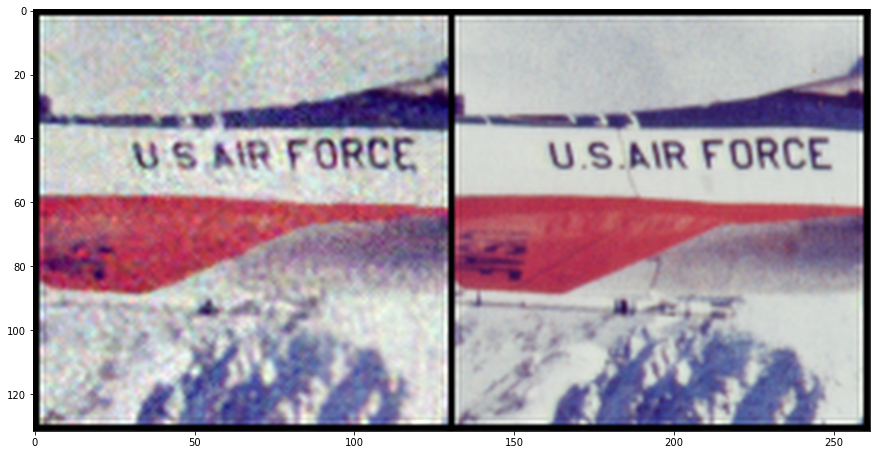

In [7]:
out_np = torch_to_np(net(net_input))
out_np = dirichlet.recover_softmax(out_np, exp_sums, dirichlet_param_scalar)
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);

In [8]:
# import math
# tt = img_noisy_np.reshape([3, 512*512])
# out = []
# for i in range(3):
#     ttt = tt[i]
#     channel_sum = sum(np.array([math.exp(xi) for xi in ttt]))
#


In [9]:
t = torch.reshape(img_noisy_torch, [3, 512 * 512])
tt=torch.softmax(t, dim=1)

RuntimeError: shape '[3, 262144]' is invalid for input of size 49152

In [ ]:
tt.size()

In [ ]:
torch.sum(tt)